# CS 583 Lecture 14: Onset Detection





 

### Utility Code

In [1]:
# General useful imports
import numpy as np
import matplotlib.pyplot as plt
import librosa 
import librosa.display
from IPython.display import Audio

from scipy import signal

from scipy.signal import find_peaks

%matplotlib inline

# Basic audio parameters

SR            = 22050                  #  sample rate default for Librosa

# Utility functions

# Round to 4 decimal places

def round4(x):
    return np.around(x,4)  

# normalize a signal so that its max = 1.0

def normalize(x):
    return x / max(x)

path = "/Users/waynesnyder/Documents/Teaching/CS583/Audio Files/"
    

ModuleNotFoundError: No module named 'librosa'

### Creating Audio Signals

In [2]:
def makeSignal(S=[(440,1,0)], A = None, duration=1.0,sr=SR):
    X = np.zeros(int(sr*duration)) 
    T = np.arange(int(sr*duration))
    for (f,amp,phi) in S:         
        X +=  amp * np.sin( 2 * np.pi * f * T / sr + phi )
    X / max(X)         # normalize to amplitude 1.0
    if(A == None):
        return  X       
    else:
        return  A * X    

In [3]:
# create a dictionary of piano key frequencies

# see https://en.wikipedia.org/wiki/Piano_key_frequencies

notenames = ['A0', 'Bb0', 'B0', 'C1', 'C#1', 'D1', 'Eb1', 'E1', 'F1', 'F#1',
       'G1', 'Ab1', 'A1', 'Bb1', 'B1', 'C2', 'C#2', 'D2', 'Eb2', 'E2',
       'F2', 'F#2', 'G2', 'Ab2', 'A2', 'Bb2', 'B2', 'C3', 'C#3', 'D3',
       'Eb3', 'E3', 'F3', 'F#3', 'G3', 'Ab3', 'A3', 'Bb3', 'B3', 'C4',
       'C#4', 'D4', 'Eb4', 'E4', 'F4', 'F#4', 'G4', 'Ab4', 'A4', 'Bb4',
       'B4', 'C5', 'C#5', 'D5', 'Eb5', 'E5', 'F5', 'F#5', 'G5', 'Ab5',
       'A5', 'Bb5', 'B5', 'C6', 'C#6', 'D6', 'Eb6', 'E6', 'F6', 'F#6',
       'G6', 'Ab6', 'A6', 'Bb6', 'B6', 'C7', 'C#7', 'D7', 'Eb7', 'E7',
       'F7', 'F#7', 'G7', 'Ab7', 'A7', 'Bb7', 'B7', 'C8', 'R']

# Create chromatic scale, e.g., as on the piano, as a dictionary    

Freqs = {} 

f = 27.5

for name in notenames:
    Freqs[name] = f
    f *= 2**(1/12)

Freqs['R'] = 0                    # a rest (silence) 

# test

Freqs['C8']

4186.009044809592

In [4]:
# get signal array and sample rate from a local audio file, will resample to 
#     default SR of 22050

import soundfile as sf
import io
import warnings

from six.moves.urllib.request import urlopen

def readSignal(name,sr=None):    
    if(name[:5] == 'https'):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            X, fileSR = sf.read(io.BytesIO(urlopen(name).read()))           
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            X, fileSR = librosa.load(name)
    if((sr == None) or (fileSR == sr)):
        return X
    else:
        return librosa.resample(X,fileSR,SR) 

# write signal array out to a file in your local directory (or to complete path name)

def writeSignal(name,data,sr=SR):
    sf.write(name,data,sr)
    

In [5]:
import contextlib
import wave
import array

# I/O for Wave files

# Read a mono wave file from a local file and return the entire file as a 1-D numpy array

def readWaveFile(infile,withParams=False,asNumpy=True):
    with contextlib.closing(wave.open(infile)) as f:
        params = f.getparams()
        frames = f.readframes(params[3])
        if(params[0] != 1):
            print("Warning in reading file: must be a mono file!")
        if(params[1] != 2):
            print("Warning in reading file: must be 16-bit sample type!")
        if(params[2] != 44100):
            print("Warning in reading file: must be 44100 sample rate!")
    if asNumpy:
        X = array.array('h', frames)
        X = np.array(X,dtype='int16')
    else:  
        X = array.array('h', frames)
    if withParams:
        return X,params
    else:
        return X

# Write out an array as a wave file to the local directory
        
def writeWaveFile(fname, X):
    X = [clip(x) for x in X]
    params = [1,2, SR , len(X), "NONE", None]
    data = array.array("h",X)
    with contextlib.closing(wave.open(fname, "w")) as f:
        f.setparams(params)
        f.writeframes(data.tobytes())
    print(fname + " written.")



### Two functions for displaying waveforms

In [6]:
# Display 


def displaySignal(X, sr=SR, title='Signal Window for X',x_units = "Seconds", figsize=(14,6),gridlines=False): 
    
    if(x_units == "Seconds"):
        T = np.arange(0, len(X)/sr, 1/sr)
    elif(x_units == "Milliseconds"):
        T = np.arange(0, 1000*len(X)/sr, 1000/sr)
    elif(x_units == "Samples"):
        T = np.arange(len(X))

    plt.figure(figsize=figsize)   # Set x and y dimensions of window: may need to redo for your display
    plt.title(title, fontsize=14, fontweight='bold')
    if(x_units=="Samples"):
        plt.xlabel("Sample Number")
    else:
        plt.xlabel(x_units)
    plt.ylabel("Amplitude")
    plt.ylim([-1.1,1.1])
    plt.plot([0,T[-1]],[0,0],color='black')      # draw the 0 line in black
    plt.plot(T,X)                    
    plt.grid(gridlines)                     # if you want dotted grid lines
    plt.show()
    
# test

# f = 10
# X = makeSignal([(10,1,0)])
# displaySignal(X,gridlines=True)

# displaySignal(X,x_units="Samples")

# displaySignal(X,x_units="Milliseconds")


In [7]:
# display the waveform

def displaySignal2(x,sr=SR,title='Signal X',):
    plt.figure(figsize=(12,6))
    plt.title(title)
    plt.ylim([-1.1,1.1])           # if you want the full range -1 .. 1, else will adapt to signal
    plt.plot([0,librosa.get_duration(x)],[0,0],linewidth=1,color='k') # if you want a 0 line
    #plt.grid()                    # if you want gridlines
    librosa.display.waveshow(x,sr=sr)
    plt.show()
    
# X = readSignal(k + "trumpet_A4_1_forte_normal.wav")

# displaySignal(X)

### Fast Fourier Transform

The following returns the real spectrum of a signal (amplitude only, no phase) as an array of floats of length $\lfloor N/2\rfloor + 1$ for frequencies 0, f, 2f, ..., up to the Nyquist limit (half the sample rate). 

In [8]:
def realFFT(X):
    return 2*abs(np.fft.rfft(X))/len(X) 

# test

# X = makeSignal(S=[(220,0.5,0),(440,0.3,0),(880,0.2,0),(1100,0.1,0),],duration = 0.19)

# S = realFFT(X)

# print("window frequency", round4(1/0.19))

# print("220 =",220/(1/0.19), "*", round4(1/0.19))
# print()

# for i in range(35,50):
#     print("S["+str(i)+"]:",S[i])

# plt.figure(figsize=(12,6))
# plt.plot(S)
# plt.show()

In [9]:
# We can also return a list of triples of form  [f, A, phi] for each frequency
# f detected by the transform, however, note that, due to floating-point error, 
# you will get extremely small values instead of 0.0 for most of the frequencies; 
# therefore allow the option of filtering out these values using np.isclose(...)
    
def spectrumFFT(X,filterZeros=True):
    R =  np.fft.rfft(X)
    if(filterZeros):
        return np.array([ ( k*SR/len(X), 2.0 * np.absolute(R[k])/len(X),np.angle(R[k])+(np.pi/2) ) 
                            for k in range(len(R)) 
                                if not np.isclose(2.0 * np.absolute(R[k])/len(X),0.0) ]) 
    else:
        return np.array([ ( k*SR/len(X), 2.0 * np.absolute(R[k])/len(X),np.angle(R[k])+(np.pi/2) ) 
                            for k in range(len(R)) ]) 

# test
    
# T = np.arange(SR*0.1)    # duration = 0.1 sec
# SR = 22050
# X = 10000 * np.sin( 2 * np.pi * 1000 * T / SR )
# X += 5000 * np.sin( 2 * np.pi * 3000 * T / SR )
# X += 2500 * np.sin( 2 * np.pi * 5000 * T / SR )

# print(round4(spectrumFFT(X)))
# print()
# S = spectrumFFT(X,False)
# print(round4(S[:5]))
# print()
# print(round4(S[98:104]))
# print()
# print(round4(S[-5:]))

### Inverse FFT

In [10]:
# To create a signal of N samples, must input a spectrum array
# of length N/2 + 1 amplitudes, with the kth frequency bin
# representing the amplitude of frequency k*(SR/N)

def realIFFT(S,A=None):
    S = np.array(S)
    lenX = 2*(len(S)-1)
    complex_S = lenX / 2 * -1.j * S
    X = np.fft.irfft(complex_S)
    if(A == None):
        return X
    else:
        return A * X / max(X)

# test

# S = np.zeros(22050)
# S[220] = 1.0
# S[440] = 0.5
# S[880] = 0.25
# S[1760] = 0.125
# X = realIFFT(S)
# plt.plot(X[:1000])
# plt.show()

# Audio(X,rate=SR)

###  Displaying Instantaneous Spectra

Matplotlib has a useful function to display a spectrum for the whole signal; by giving it
a short "window" you can get the same information contained in one column of the spectrogram:

https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.magnitude_spectrum.html

The term "magnitude spectrum" refers to the fact that we are interested in magnitude
of the various frequencies which make up the signal, instead of the power spectrum (square of the magnitudes) or the phase spectrum (what the phase of the various frequency components are). 


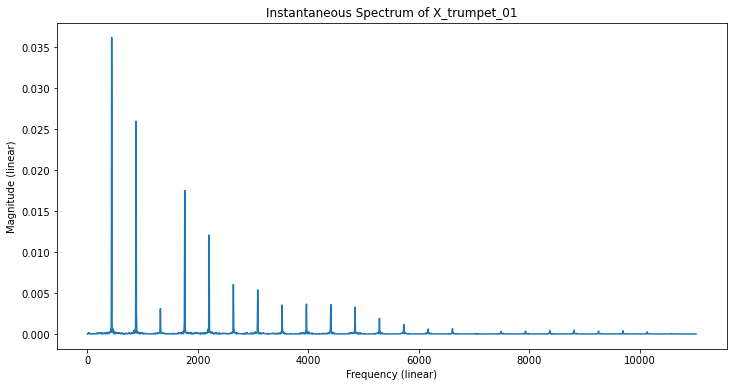

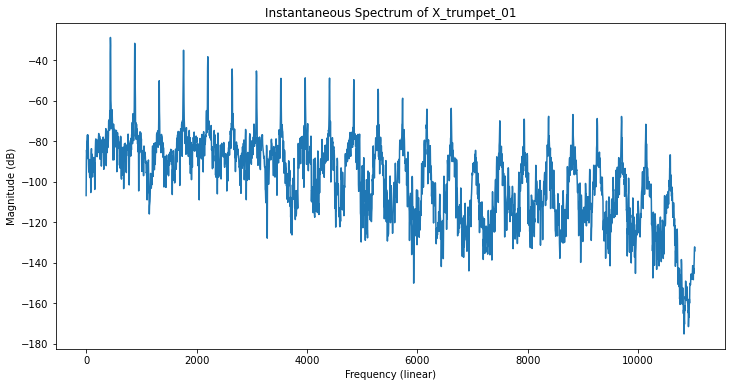

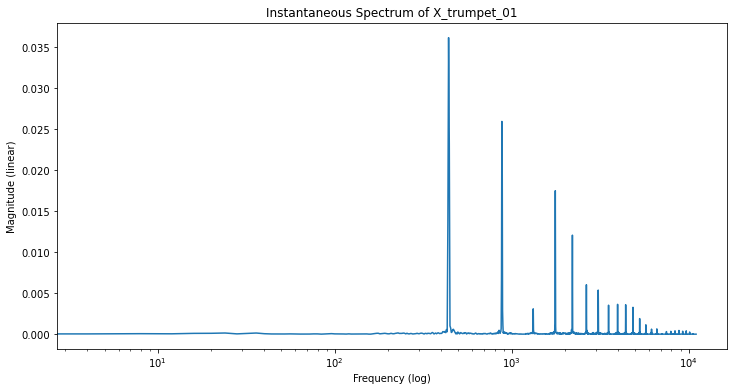

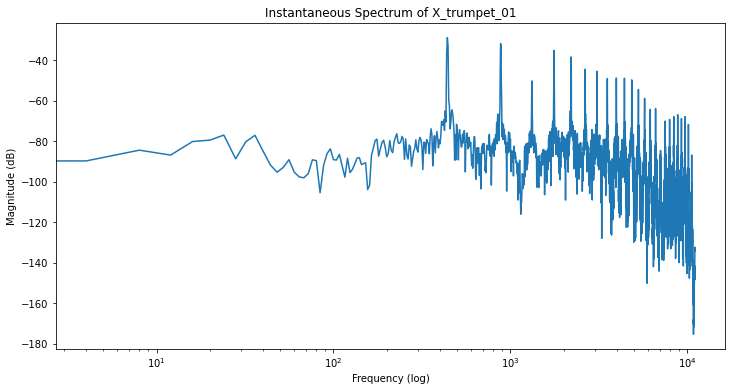

In [11]:
# display the spectrum:   xscale (frequency) can be 'linear' or 'log',
#     and yscale can be 'linear' or 'dB' (essentially log)

def displaySpectrum(X,sr=SR,title='Spectrum of X',xscale='linear',yscale='dB'):
    plt.figure(figsize=(12,6))
    plt.title(title)
    plt.magnitude_spectrum(X,sr,scale=yscale)
    if(xscale == 'linear'):
        plt.xlabel('Frequency (linear)')
    else:    
        plt.xlabel('Frequency (log)')
    if(yscale == 'linear'):
        plt.ylabel('Magnitude (linear)')
    else:    
        plt.ylabel('Magnitude (dB)')
    plt.xscale(xscale)
    plt.show()
    
    
# Example: Create a signal with a simple spectrum

X_trumpet = readSignal(path + "trumpet_A4_1_forte_normal.wav")

# displaySignal(X,title="Signal X: Trumpet playing note A4 = 440 Hz")

X_trumpet_01 = X_trumpet[11025:16537]

# displaySignal(X1,title="Signal X1:  Signal X from 0.5 - 0.75 secs")

# # display the spectrum   scale is 'linear' or 'dB'
    
displaySpectrum(X_trumpet_01,title="Instantaneous Spectrum of X_trumpet_01", xscale='linear', yscale='linear')

displaySpectrum(X_trumpet_01,title="Instantaneous Spectrum of X_trumpet_01",xscale='linear', yscale='dB')

displaySpectrum(X_trumpet_01,title="Instantaneous Spectrum of X_trumpet_01",xscale='log', yscale='linear')

displaySpectrum(X_trumpet_01,title="Instantaneous Spectrum of X_trumpet_01",xscale='log', yscale='dB')

### Displaying Spectrograms

We can use `librosa.display.specshow` to show spectrograms, which are heatmaps of
spectra over top. Various parameters can be set, including:

    y_axis :   'linear', 'log', 'mel'

    fmin, fmax :  frequency bounds for the mel frequency spectrogram; defaults are fmin=0 and fmax=SR/2 (Nyquist limit)
    
In addition, the `librosa.stft` function takes parameters

    n_fft :    length of the analysis window in samples; defaults to 2048
    
    hop_length : how many samples the window is moved forward for every spectrum; defaults to n_fft / 4

The following is produces a linear scale on the frequency (Y) axis; notice that the typical linear spacing of harmonics (f, 2f, 3f, 4f, etc.) is shown clearly, and correspond to the instantaneous spectrum with a linear frequency scale shown above. 

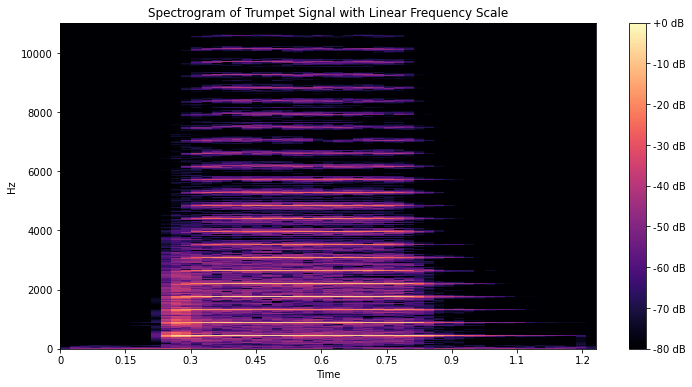

In [12]:
# display the spectrogram

S = np.abs(librosa.stft(X_trumpet))                    # calculate the 2D spectrogram
Sdb = librosa.amplitude_to_db(S, ref=np.max)   # will show power spectrum in heatmap

plt.figure(figsize=(12,6))
plt.title("Spectrogram of Trumpet Signal with Linear Frequency Scale")
librosa.display.specshow(Sdb, sr=SR, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.show()

Now we change the frequency scale to a log scale, and we can see that the linear sequence of harmonics gets closer and closer together, just as they do on the log scale spectrum above, and, in fact, on a piano keyboard. 

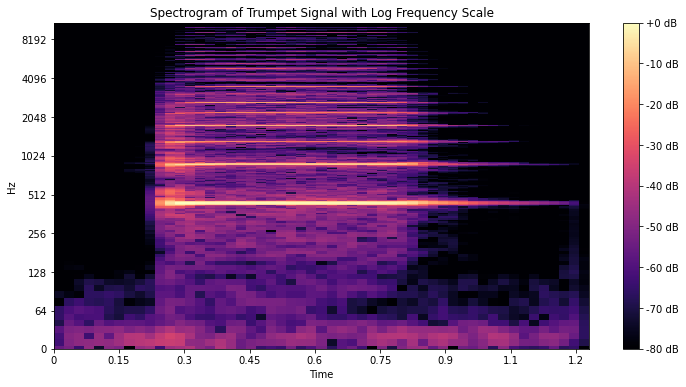

In [13]:
S = np.abs(librosa.stft(X_trumpet))                    # calculate the 2D spectrogram
Sdb = librosa.amplitude_to_db(S, ref=np.max)   # will show power spectrum in heatmap

plt.figure(figsize=(12,6))
plt.title("Spectrogram of Trumpet Signal with Log Frequency Scale")
librosa.display.specshow(Sdb, sr=SR, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.show()

### Filterbanks, Mel Scale, Spectrum, and Spectrogram

We can think of the FFT as a sequence of *filters* that isolate the energy in certain frequency bands,
according to the sequence of frequencies 0, f, 2f, etc. up to the Nyquist Limit.  The general approach is often called a *filter bank*, and algorithms can be written that determine the energy at frequencies in different bands than the FFT.

One of the most common approaches (other than the FFT) in Music Information Retrieval uses a sequence of frequency bands that correspond more closely to the logarithmic scale of frequencies in Western music notation and the piano keyboard. 

The Mel Scale is based on research from almost a century ago that pitch (human perception of the frequency of a tone) is not the same as the
frequency as determined by physical measurements or by an algorithm. 

This is a modification of the log scale, according to the following formula:

$$m\ =\ 2595\cdot \text{log}_{10}\bigl ( 1 + {f\over 700} \bigr )$$

and can be graphed as follows:

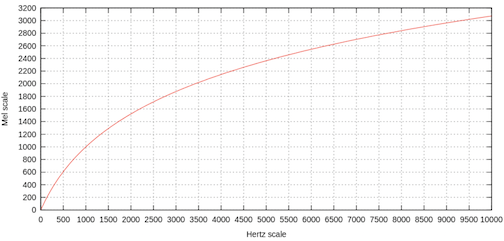

A *mel scale* is used to give a closer approximation to human perception of musical pitch, just as the power spectrum is used to give a closer approximation to loudness. Neither is perfectly accurate, as many, many factors influence the psycho-acoustic perception of musical signals, but they are the best possible approximations (at present). 

The range of the mel scale can be set with `fmin` (defaults to 0) to `fmax` (defaults to SR/2, the Nyquist limit), but can be set lower. 

The parameter `n_mels` (defaulting to 128) gives the number of frequency bins in this range, according to the mel scale. 



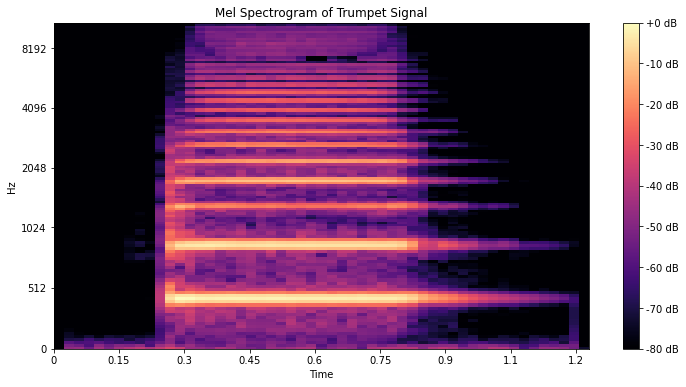

In [14]:
mel_spect = librosa.feature.melspectrogram(y=X_trumpet, sr=SR, n_fft=1024, hop_length=512)
mel_spect = librosa.power_to_db(mel_spect, ref=np.max)

plt.figure(figsize=(12,6))
librosa.display.specshow(mel_spect, y_axis='mel',  x_axis='time');
plt.title('Mel Spectrogram of Trumpet Signal');
plt.colorbar(format='%+2.0f dB');

Notice in the next spectrogram that the maximum frequency has been set to 4200 (approximately the highest frequency on the piano keyboard) and there are only 64 mel frequency bands. 

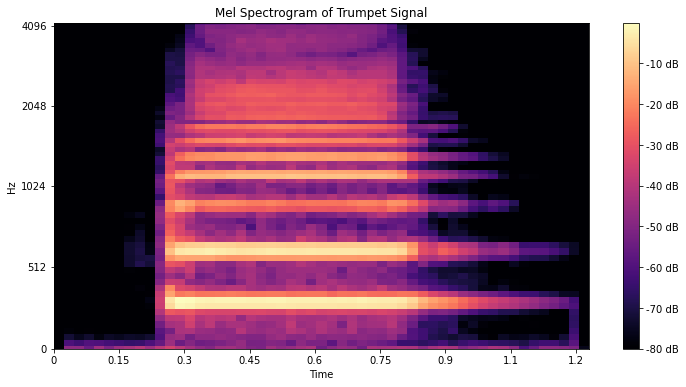

In [15]:
mel_spect = librosa.feature.melspectrogram(y=X_trumpet, sr=SR, n_fft=1024, hop_length=512,n_mels=64)
mel_spect = librosa.power_to_db(mel_spect, ref=np.max)

plt.figure(figsize=(12,6))
librosa.display.specshow(mel_spect, y_axis='mel', fmax=4200, x_axis='time');
plt.title('Mel Spectrogram of Trumpet Signal');
plt.colorbar(format='%+2.0f dB');

### Ok, on to new material....

### Onset Detection

There are several ways to approach the subject of *onset detection*, basically looking at different sliding windows and determining when changes occur in various attributes such as amplitude or spectra.  

In this lecture we will first look at amplitude-based methods, and then explore using information from the spectra of successive windows. 

In [3]:

# First test: add 0.5 second of silence, then every succeeding note is 0.5 seconds later
X_KS = readSignal(path+"KS.guitar.C.scale.wav") 

displaySignal(X_KS)
Audio(X_KS,rate=SR)

NameError: name 'readSignal' is not defined

The reason for choosing this as a first example is that it is synthetic and has very fast onsets:

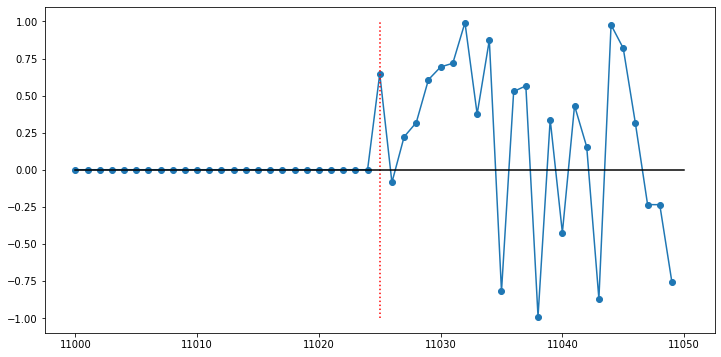

In [17]:
# start = 33050
# end = 33100
# onset = 33075
start = 11000
end = 11050
onset = 11025
plt.figure(figsize=(12,6))
plt.plot(range(start,end),X_KS[start:end])
plt.scatter(range(start,end),X_KS[start:end])
plt.plot([onset,onset],[-1,1],color='r',linestyle='dotted')
plt.plot([start,end],[0,0],color='k')
plt.show()

# [10880 21888 32896 43904 54912 66048 77056 88064]

In [191]:
import numpy as np
x = [1,4,-2,5,4,-3]



rectify(x)

# if(isinstance(x,np.ndarray)):
#         print(np.maximum(x,np.zeros(len(x))))

[1.0, 4.0, 0.0, 5.0, 4.0, 0.0]

In [2]:
# Amplitude-based onset detection

# The energy in a window is the mean of the squared amplitudes

def energy(x):
    return (x @ x) / len(x)

# Half-wave rectification

def rectify(x):
    if(isinstance(x,np.ndarray)):
        return np.maximum(x,np.zeros(len(x)))
    elif(isinstance(x,list)):
        return list(np.maximum(x,np.zeros(len(x))))
    else:
        return max(x,0)



def AmplitudeBasedOnsets(X,window_size=512,overlap=0.5,scale=10,
                         height=None,
                         prominence=None,
                         distance=None,
                         displayAll=False):
    
    N = len(X)
    
    X = X / max(X)       # normalize amplitude

    skip = int((1-overlap)*window_size)
    
    print("skip:",skip)

    num_windows = (N // skip) - 1

    window_locations = skip * np.arange(num_windows)

    X_energy = np.array( [ energy( X[ w : (w+window_size)] ) for w in window_locations ])

#     X_energy = []
#     for w in window_locations:
#         e = energy( X[ w : (w+window_size)] )
#         #print(w,(w+window_size),e)
#         X_energy.append(e)
    
    X_energy = np.array(X_energy)
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("X Energy Signal")
        plt.plot(X_energy)
        plt.show()

    # take the log with scaling factor
    # if scale = None, don't do the log

    if(scale == None):
        X_energy_log = X_energy
    else:
        X_energy_log = np.log(1 + scale*X_energy)

        if(displayAll):
            plt.figure(figsize=(12,4))
            plt.title("Log X Energy Signal with scale factor "+str(scale))
            plt.plot(X_energy_log)
            plt.show()

    # Difference = Novelty Function
    
    # add 0 at beginning so diff alines with change in new window
    
    X_energy_log = np.concatenate([[0],X_energy_log])    

    # Take the discrete differential; watch out, diff transforms array in place

    X_energy_novelty = np.diff(list(X_energy_log)) 
    
    # standardize novelty
    
    X_energy_novelty = X_energy_novelty / max(X_energy_novelty)
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("X Energy Novelty")
        plt.plot(X_energy_novelty)
        plt.show()

    X_energy_novelty_rectified = rectify(X_energy_novelty)      
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("Rectified X Energy Novelty")
        plt.plot(X_energy_novelty_rectified)
        plt.show()

    # peak picking

    peaks,_ = find_peaks(X_energy_novelty_rectified,
                         height=height,prominence=prominence,distance=distance)   

    if(len(peaks)==0):
        print("No peaks found!")
        return (np.array([]), np.zeros(len(X)))
    
    plt.figure(figsize=(12,4))
    plt.title("Picking Peaks")
    plt.plot(peaks, X_energy_novelty_rectified[peaks], "or")
    plt.plot(X_energy_novelty_rectified)
    plt.show()
    
    # peaks are beginning of window, more accurate to make the onsets in the middle
    # of the window, reduces potential error by 1/2
    
    onsets = peaks*skip + window_size//2

    plt.figure(figsize=(12,4))
    plt.title("Signal with Onsets")
    plt.plot(X)
    for k in range(len(onsets)):
        plt.plot([onsets[k],onsets[k]],[-1,1],color='r')    
    plt.show()
    
    clicks = librosa.clicks(times=onsets/SR, sr=SR, 
                        hop_length=skip, length=len(X))
    
    return (onsets,clicks)

    
(On,clicks) = AmplitudeBasedOnsets(X_KS,window_size=128,overlap=0.5,
                                   scale=20,prominence=0.2,displayAll=True)
    
    #return (onsets,clicks,window_locations,X_energy_novelty_rectified)

    
# (On,clicks,winds,eng) = AmplitudeBasedOnsets(X_KS,window_size=128,overlap=0.5,
#                                   scale=20,prominence=0.2,displayAll=True)

#. just for the KS guitar signal
print((On))
print((On/SR))
e = np.mean((On/SR)-np.array([0.5,1.0,1.5, 2.0, 2.5, 3.0,3.5, 4.0]))
print("mean error:", round4(e), "seconds")

NameError: name 'X_KS' is not defined

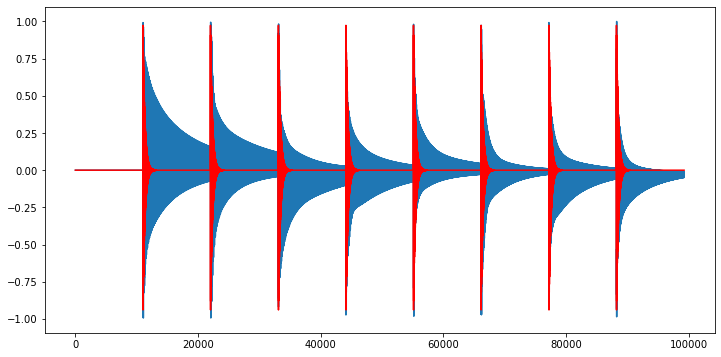

In [19]:

plt.figure(figsize=(12,6))
plt.plot(X_KS)
plt.plot(clicks,color='r')
plt.show()

Audio([X_KS,clicks],rate=SR)

This has worked pretty well, as you can see here in a stereo waveform view:

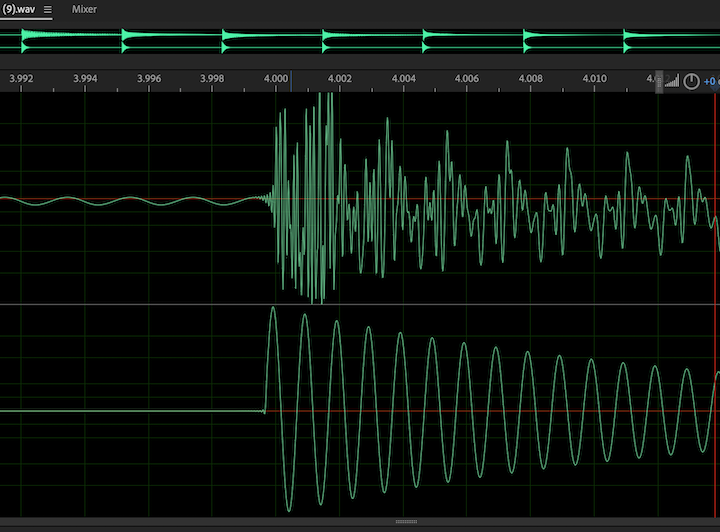

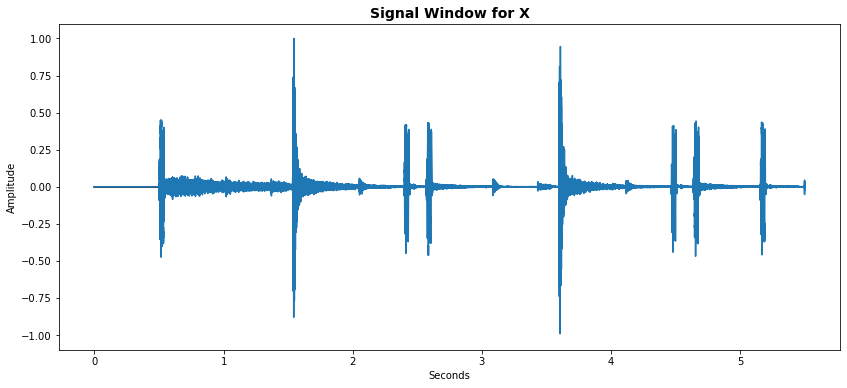

In [20]:
X5 = readSignal(path+"drum.58bpm.wav")[:SR*5]

X5 = np.concatenate([np.zeros(11025),X5])

displaySignal(X5)
Audio(X5,rate=SR)

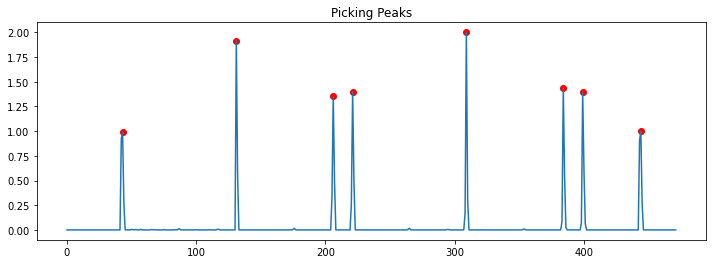

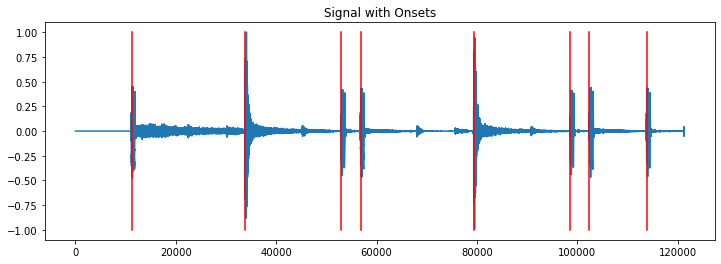

[ 11264  33792  52992  56832  79360  98560 102400 113920]


In [21]:
(P5,clicks5) = AmplitudeBasedOnsets(X5,window_size=512,overlap=0.5,
                                    scale=100,prominence=0.6)

print(P5)

Audio([X5,clicks5],rate=SR)

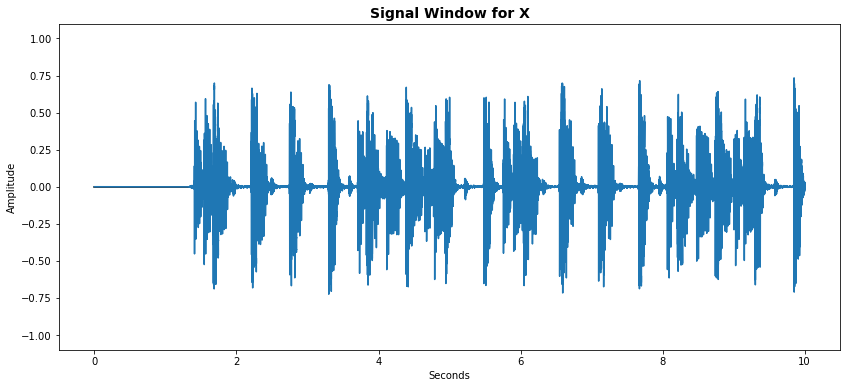

In [22]:
X2 = readSignal(path+"AnotherOneBitesTheDust.mp3")[:int(SR*10)]

displaySignal(X2)
Audio(X2,rate=SR)

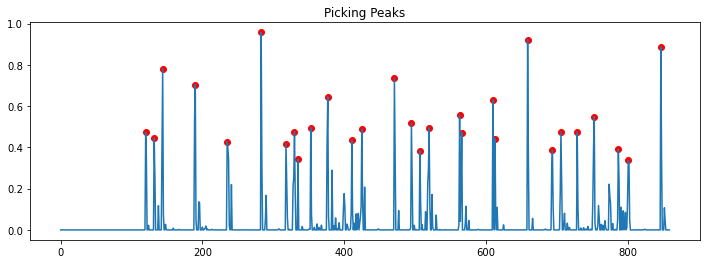

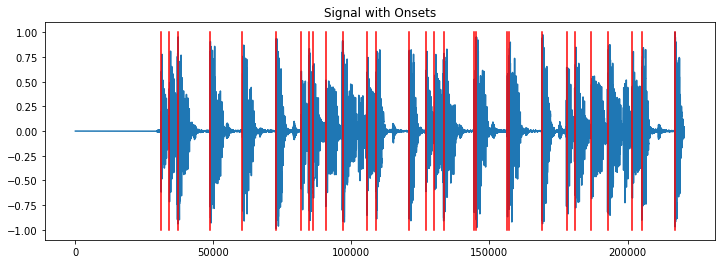

In [23]:
(P2,clicks2) = AmplitudeBasedOnsets(X2,window_size=512,overlap=0.5,
                                    scale=10,prominence=0.3)

Audio([X2,clicks2],rate=SR)

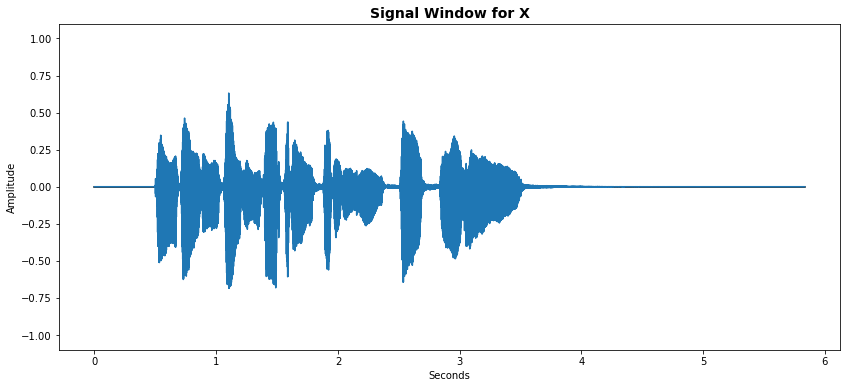

In [24]:
X3,_ = librosa.load(librosa.ex('trumpet'))

X3 = np.concatenate([np.zeros(11025),X3])

displaySignal(X3)
Audio(X3,rate=SR)

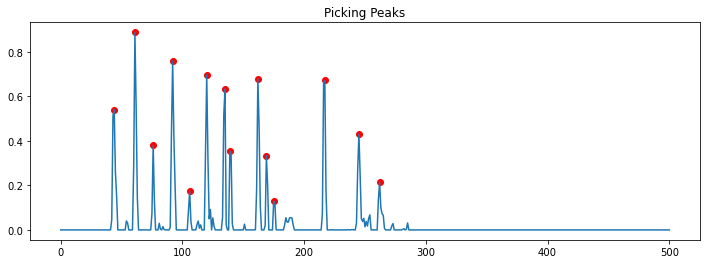

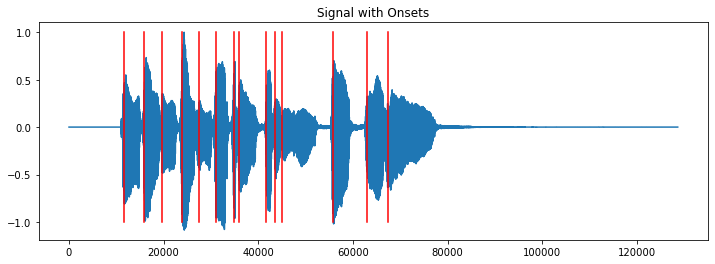

In [25]:
(P3,clicks3) = AmplitudeBasedOnsets(X3,window_size=512,overlap=0.5,
                                    scale=50,
                                    prominence=0.12)

Audio([X3,clicks3],rate=SR)

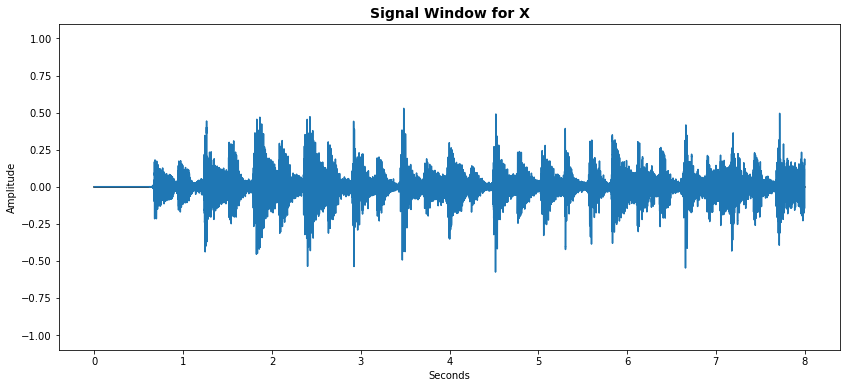

In [26]:
X9 = readSignal(path+"MyOldKentuckyHome.wav")

X9 = X9[:SR*8]

displaySignal(X9)
Audio(X9,rate=SR)

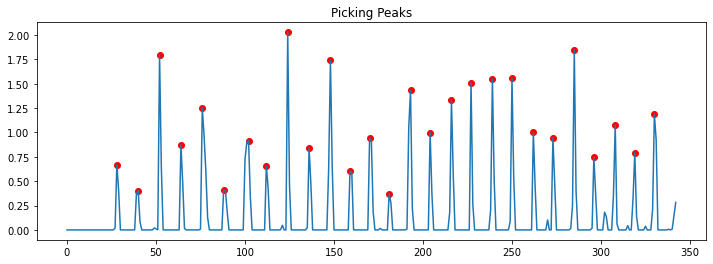

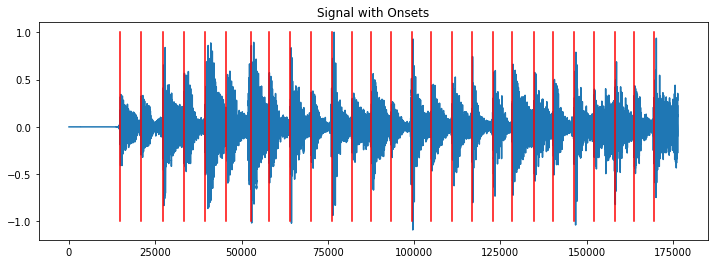

In [27]:
(P9,clicks9) = AmplitudeBasedOnsets(X9,window_size=1024,overlap=0.5,
                                    scale=100,height=0.3,prominence=0.1,distance=10)

#print(P8)

Audio([X9,clicks9],rate=SR)

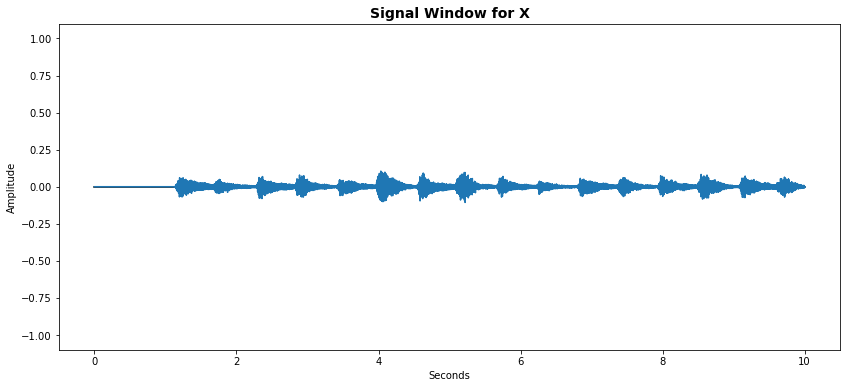

In [28]:
X7,_ = librosa.load(librosa.ex('nutcracker'))

X7 = X7[:SR*10]

displaySignal(X7)
Audio(X7,rate=SR)

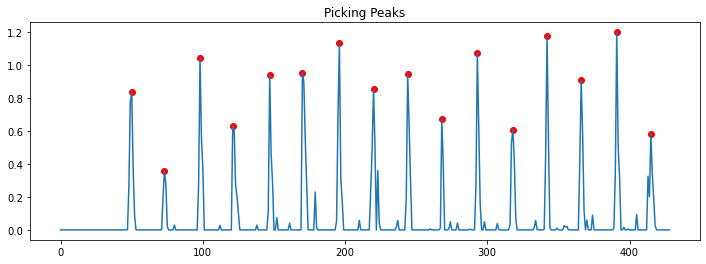

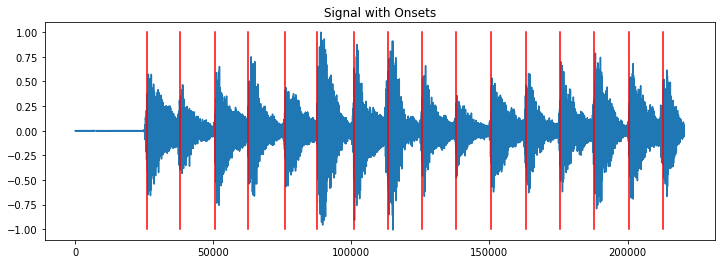

[ 26112  37888  50688  62464  75776  87552 100864 113152 125440 137728
 150528 163328 175616 187904 200704 212992]


In [29]:
(P7,clicks7) = AmplitudeBasedOnsets(X7,window_size=1024,overlap=0.5,
                                    scale=100,height=0.3,prominence=0.3,distance=20)

print(P7)

Audio([X7,clicks7],rate=SR)

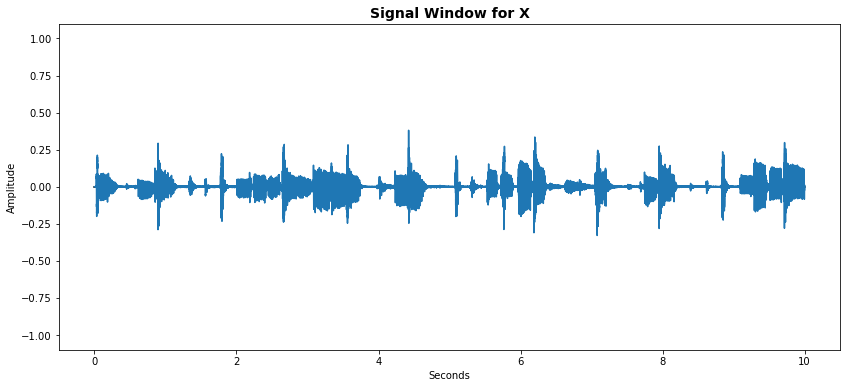

In [30]:
X6,_ = librosa.load(librosa.ex('choice'))

X6 = X6[:SR*10]

displaySignal(X6)
Audio(X6,rate=SR)

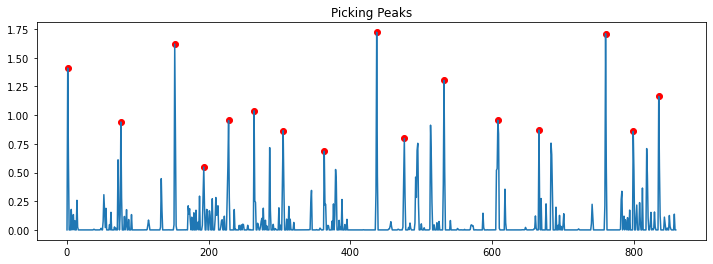

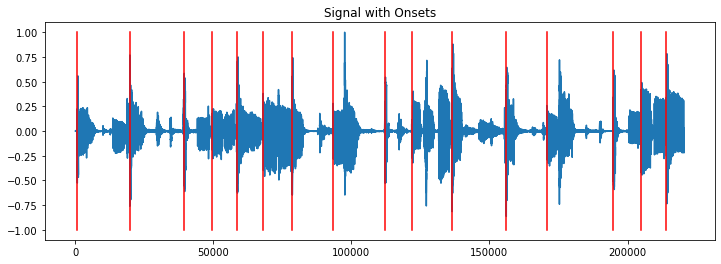

[   512  19712  39168  49664  58624  67840  78336  93184 112128 122112
 136448 155904 170752 194816 204800 214016]


In [31]:
(P6,clicks6) = AmplitudeBasedOnsets(X6,window_size=512,overlap=0.5,
                                    scale=100,height=0.5,prominence=0.5,distance=20)

print(P6)

Audio([X6,clicks6],rate=SR)

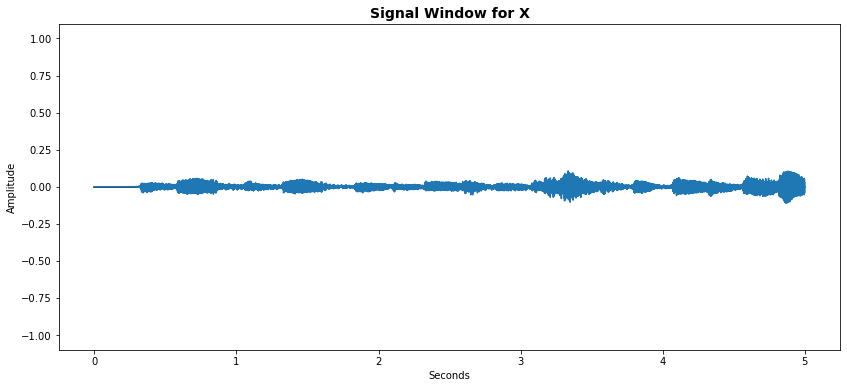

In [32]:
X4 = readSignal(path+"invention.C4.wav")[:SR*5]

displaySignal(X4)
Audio(X4,rate=SR)

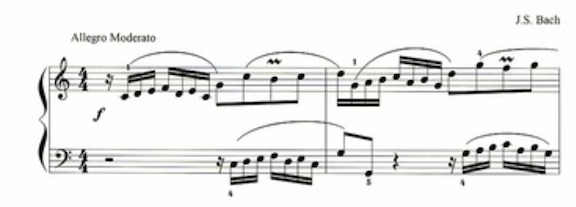

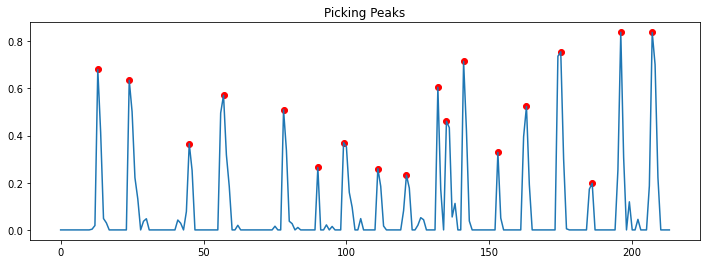

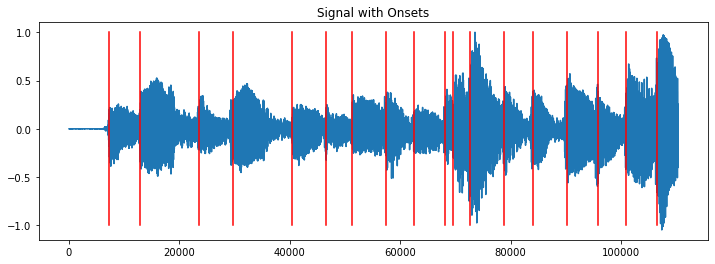

[  7168  12800  23552  29696  40448  46592  51200  57344  62464  68096
  69632  72704  78848  83968  90112  95744 100864 106496]


In [33]:
(P4,clicks4) = AmplitudeBasedOnsets(X4,window_size=1024,overlap=0.5,
                                    scale=100,prominence=0.15)

print(P4)

Audio([X4,clicks4],rate=SR)

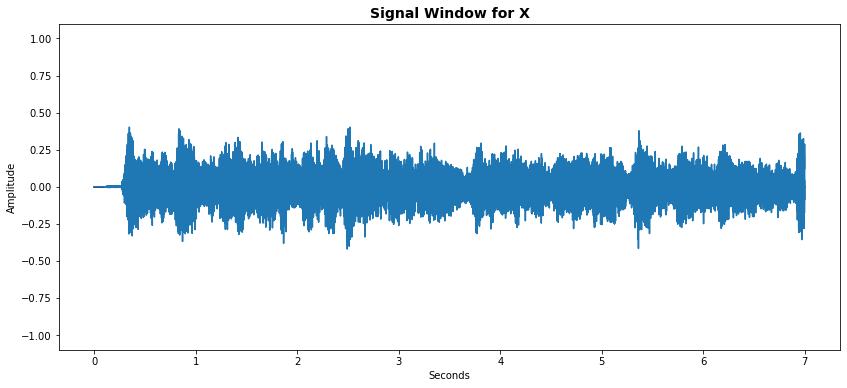

In [34]:
X8,_ = librosa.load(librosa.ex('brahms'))

X8 = X8[:SR*7]

displaySignal(X8)
Audio(X8,rate=SR)

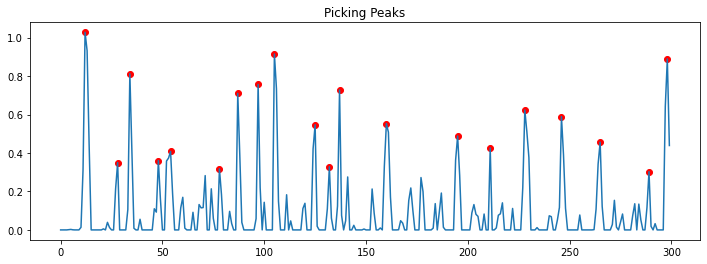

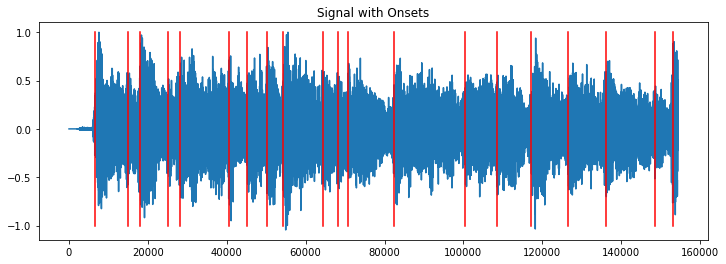

In [35]:
(P8,clicks8) = AmplitudeBasedOnsets(X8,window_size=1024,overlap=0.5,
                                    scale=100,height=0.3,prominence=0.01,distance=5)

#print(P8)

Audio([X8,clicks8],rate=SR)

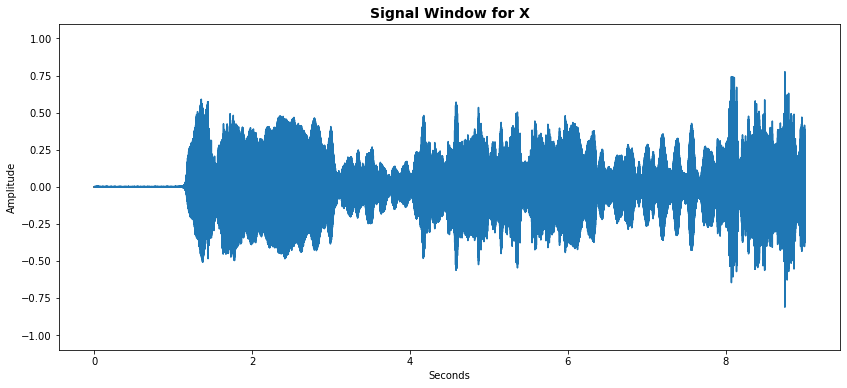

In [36]:
X10 = readSignal(path+"Shakuhachi_Flute.mp3")

X10 = X10[SR:SR*10]

displaySignal(X10)
Audio(X10,rate=SR)

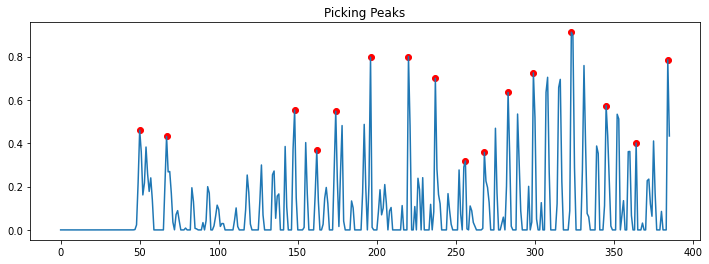

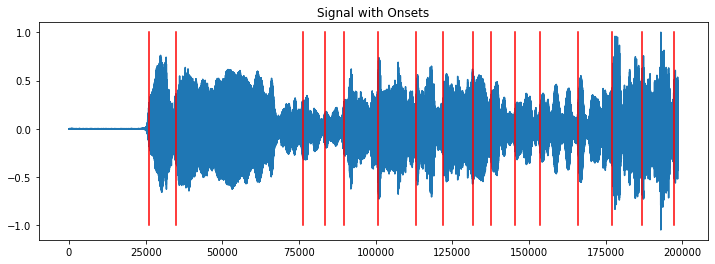

In [37]:
(P10,clicks10) = AmplitudeBasedOnsets(X10,window_size=1024,overlap=0.5,
                                    scale=100,height=0.3,prominence=0.1,distance=10)

#print(P8)

Audio([X10,clicks10],rate=SR)

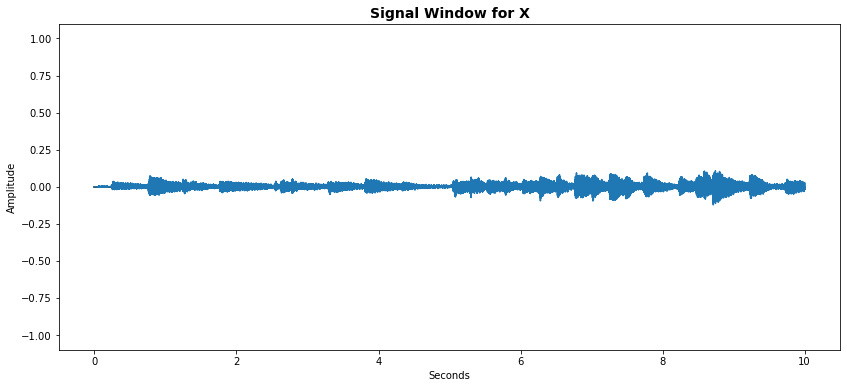

In [38]:
X11 = readSignal(path+"Bach.WTC.1.1.mp3")

X11 = X11[:int(SR*10)]

displaySignal(X11)
Audio(X11,rate=SR)

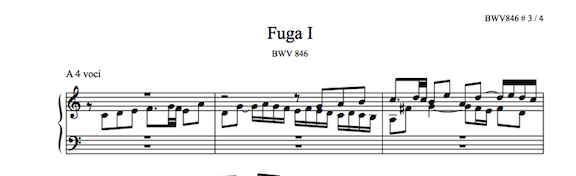

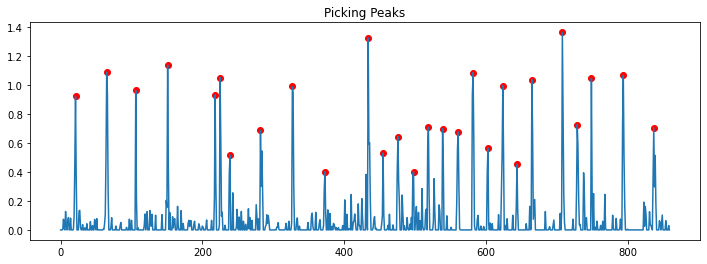

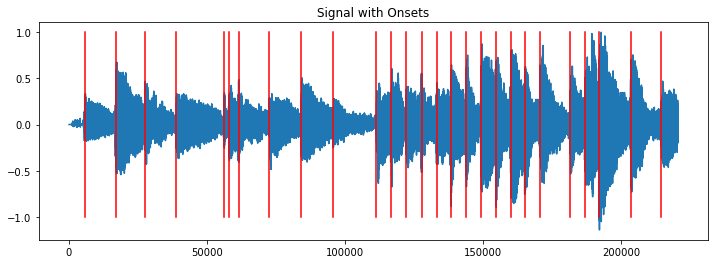

In [39]:
(P11,clicks11) = AmplitudeBasedOnsets(X11,window_size=512, overlap=0.5,
                                      scale=300,
                                      height=0.2,
                                      prominence=0.4,
                                      distance=5)

#print(P8)

Audio([X11,clicks11],rate=SR)

### Practical example: finding onsets for instrument recognition

skip: 8


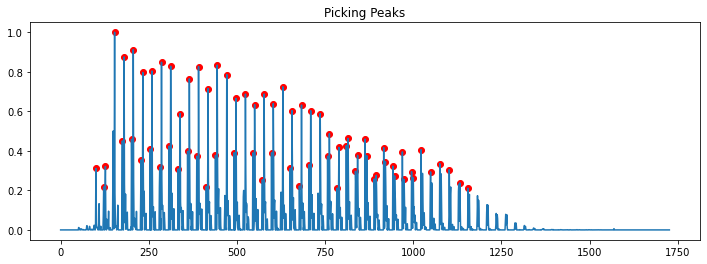

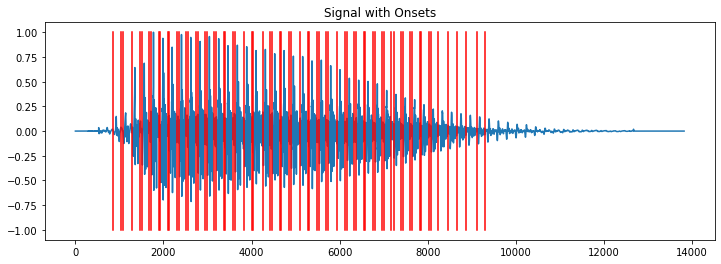

11520 864


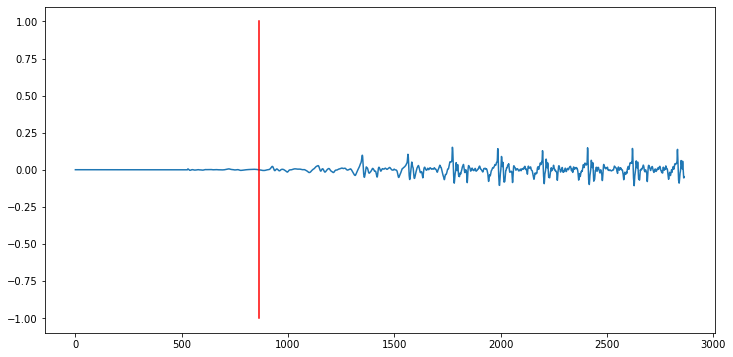

In [132]:
#First find out the shortest sample in the directory

source_folder = '/Users/waynesnyder/Documents/Research/Audio Research/Instrument Samples.forUpload/'

file1 = '016.violin_Fs7_05_fortissimo_arco-normal.mp3'

file2 = '014.tuba_C4_05_piano_normal.mp3'

file3 = '012.trombone_Gs3_05_forte_normal.mp3'

# lengths = []
# for filename in os.listdir(source_folder):
#     if((filename[0] == '.') or (not ('_' in filename))):      # to avoid hidden files such as .DS_Store
#         continue

    
X12 = readSignal(source_folder + file3)


(P12,clicks12) = AmplitudeBasedOnsets(X12,window_size=128, overlap=120/128,
                                      scale=300,
                                      height=0.1,
                                      prominence=0.2,
                                      distance=5,
                                     # displayAll=True
                                     )

onset = P12[0]
start = max(onset - 1000,0)
end = onset + 2000
print(len(X),onset)
plt.figure(figsize=(12,6))
plt.plot(X12[start:end])
plt.plot([onset-start,onset-start],[-1,1],color='r')
plt.show()

#Audio([X12,clicks12],rate=SR)

## Onset Detection using Spectrograms

Amplitude-based methods are limited because they ONLY use one dimension
of the signal, its energy in the sliding windows. More sophisticated
algorithms use the FFT and determine the *novelty* measure between the spectrum of the $n^{th}$ window and the previous window using a variety of distance metrics. We will use the following notations:
$$X(n)\ =\ \text{the spectrum of the $n^{th}$ window}$$ 

$$X(k,n)\ =\ \text{the complex value of the $k^{th}$ frequency bin in }X(n) $$ 

$$|\,X(k,n)\,|\ =\ \text{the magnitude of the complex number } X(k,n)$$ 
    
#### L1 Norm (Sum of Absolute Differences or Manhattan Streetcar Distance):

$$L_1(n)\ =\ \sum_{k=0}^K abs\bigl(|\,X(k,n)| - |X(k,n-1)|\,\bigr)$$  

#### L2 Norm (Euclidean Distance):

$$L_2(n)\ =\ \sqrt{\sum_{k=0}^K \bigl(\,|X(k,n)| - |X(k,n-1)|\,\bigr)^2}$$ 


#### Correlation Distance (CD):

$$CD(n)\ =\ 1.0 + corr\bigl(\,|X(n)|, |X(n-1)|\,\bigr)$$ 

#### Spectral flux (SF):

$$SF(n)\ =\ {\sqrt{\sum_{k=0}^K \ \bigl(\,|X(k,n)| - |X(k,n-1)|\,\bigr)^2} \over K}$$  

The spectral flux has been normalized by the number of frequency bins, however,
since this only affects the *scale* on the y-axis of the novelty function, and we
will normalize the novelty function to the range $[0..1]$ anyway, we may
consider it to be identical to the L2 Norm for this application, and we will not consider it further. 



It has also been suggested that after subtracting the spectral bins, we could rectify the
result, setting any negative values to 0, on the theory that negative values (where the spectral energy
*decreased* are not significant for onsets). Thus we could define rectified versions of the L1 and L2 norms (and the spectral flux):

$$RL_1(n)\ =\ \sum_{k=0}^K abs\bigl(rect(|\,X(k,n)| - |X(k,n-1)|)\,\bigr)$$  


$$RL_2(n)\ =\ \sqrt{\sum_{k=0}^K \bigl(\,rect(|\,X(k,n)| - |X(k,n-1)|)\,\bigr)^2}$$ 


$$RSF(n)\ =\ {\sqrt{\sum_{k=0}^K rect\bigl(\,|X(k,n)| - |X(k,n-1)|\,\bigr)^2} \over K}$$   

where

$$rect(x) \ =\ max(x,0).$$

Other modifications have been suggested, such as log-scaling the distance, or
doing the entire calculation with complex values, and and then considering
the magnitude of the complex value $d(n)$ at the end:

#### CL2 Norm (Complex Euclidean Distance):

$$CL_2(n)\ =\ abs\Bigl(\bigl(\sum_{k=0}^K (\,X(k,n) - X(k,n-1)\,\bigr)^{1\over 2}\Bigr)$$ 


One could also consider weighted sums of various components, such as the magnitude diffence and the phase difference. 

Filters may be applied before peak picking. Here are the most common ones.

In [5]:
# Apply a moving average smoothing filter to X, starting at index n//2 and ending
# at len(X)-n//2-1, returning a new smoothed array;
    
def movingAverageFilter(X,n=3):    
    Y = np.copy(X)
    for i in range(n//2,len(X)-n//2):
        Y[i] = np.mean(X[i-n//2:i+n//2+1])
    return Y

    
# Replace each X[i] by its difference from the mean of the surrounding
# n points

def subtractMAFilter(X,n=3):
    Y = np.copy(X)
    return Y - movingAverageFilter(X,n)

# Apply a median smoothing filter to X, starting at index n/2 and ending
# at len(X)-n/2-1, returning a new smoothed array;
    
def medianFilter(X,n=3):    
    Y = np.copy(X)
    for i in range(n//2,len(X)-n//2):
        Y[i] = np.median(X[i-n//2:i+n//2+1])
    return Y

# To emphasize peaks, subtract the smoothed curve from the original
    
def subtractMedianFilter(X,n=3):
    Y = np.copy(X)
    return Y - medianSmoothingFilter(X,n)

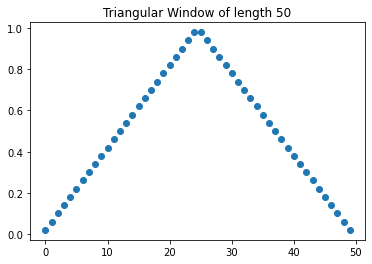

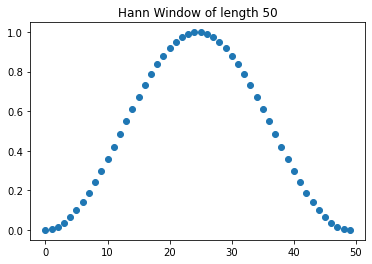

In [42]:
from scipy.signal import windows


plt.title("Triangular Window of length 50")
plt.scatter(range(50),windows.triang(50))
plt.show()

plt.title("Hann Window of length 50")
plt.scatter(range(50),windows.hann(50))
plt.show()

In [75]:
# Onset detection using various distance measure, including
# spectral flux from Lerch, p.163

# S is previous spectrum, Sn is next one

def spectral_distance(S,Sn,kind='SF2'):      # default will be Lerch, p.163
    if(kind == 'L1'):
        return np.sum(np.abs(Sn-S))
    elif(kind == 'L2'):
        return (np.sum((Sn-S)**2))**0.5
    elif(kind == 'CD'):                     # Correlation Distance:  1 - correlation
        s = np.std(S)                       # must account for spectra with all 0's
        sn = np.std(Sn)
        if(np.isclose(s,0) or np.isclose(sn,0)):
            return 0.0
        else:
            return 1.0 + (((S - np.mean(S)) @ (Sn - np.mean(Sn))) / (len(S) * s * sn))
    elif(kind == 'RL1'):
        return np.sum(np.abs(rectify(Sn-S))
    elif(kind == 'RL2'):
        return (np.sum((Sn-S)**2))**0.5
    elif(kind == 'SF1'):     # use Lerch, p.163 with L1 norm, following Dixon
        return (np.sum( [ (max(Sn[k]-S[k],0)) for k in range(len(S)) ] )) / len(S)
    elif(kind == 'SF2'):     # use Lerch, p.163 with L2 norm
        return np.sqrt(np.sum( [ (max(Sn[k]-S[k],0)**2) for k in range(len(S)) ] )) / len(S)                
    else:
        return None
    
def SpectralBasedOnsets(X,window_size=512,overlap=0.5,
                        kind = None,     # distance function used, L1, L2, CD, SF1, SF2
                        filtr = None,    # filter applied before peak picking, if any
                        size = 3,        # size of kernel used in filter
                        win = None,      # apply windowing function to window
                        scale=None,      # scale factor for log, None = no log
                        height=None,     # these 3 parameters are for pick_peak,
                        prominence=None, #    any not equal to None will be applied
                        distance=None,
                        displayAll=False):
    
    N = len(X)
    
    X = X / max(X)       # normalize amplitude

    skip = int((1-overlap)*window_size)

    num_windows = (N // skip) - 1

    window_locations = skip * np.arange(num_windows)
    
    if(win == 'hann'):
        W = windows.hann(window_size)
    elif(win == "tri"):
        W = windows.triang(window_size)
    else:
        W = windows.boxcar(window_size)
        
    X_spectrogram = np.array( [ realFFT( W * X[ w : w + window_size ] ) for w in window_locations ])   

    # take the log with scaling factor; if no log transformation, set to None
    
    if(scale == None):
        X_spectrogram_log = X_spectrogram
    else:
        X_spectrogram_log = np.log(1 + scale*X_spectrogram)

    # Difference = Novelty Function

    X_spectral_novelty = np.zeros(num_windows)
    
    for k in range(1,num_windows):           #first value will be 0, length unchanged
        X_spectral_novelty[k] = \
              spectral_distance(X_spectrogram_log[k-1],X_spectrogram_log[k],kind)
    
    #print(X_spectral_novelty)
    
    # normalize spectral novelty function
    
    X_spectral_novelty = normalize(X_spectral_novelty)
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("X Spectral Novelty")
        plt.plot(X_spectral_novelty)
        plt.show()


#     Distance functions are always >= 0
#     X_spectral_novelty_rectified = rectify(X_spectral_novelty)      
    
#     if(displayAll):
#         plt.figure(figsize=(12,4))
#         plt.title("Rectified X Spectral Novelty")
#         plt.plot(X_spectral_novelty_rectified)
#         plt.show()
        
    if(filtr != None):
        X_spectral_novelty = filtr(X_spectral_novelty,size)
        if(displayAll):
            plt.figure(figsize=(12,4))
            plt.title("Filtered X Spectral Novelty")
            plt.plot(X_spectral_novelty)
            plt.show()
            
    # peak picking

    peaks,_ = find_peaks(X_spectral_novelty,height=height,prominence=prominence,distance=distance)   # this works pretty well

    if(len(peaks)==0):
        print("No peaks found!")
        return (np.array([]), np.zeros(len(X)))
    
    plt.figure(figsize=(12,4))
    plt.title("Picking Peaks")
    plt.plot(peaks, X_spectral_novelty[peaks], "or")
    plt.plot(X_spectral_novelty)
    plt.show()

    # peaks are beginning of window, more accurate to make the onsets in the middle
    # of the window, reduces potential error by 1/2
    
    onsets = peaks*skip + window_size//2

    plt.figure(figsize=(12,4))
    plt.title("Signal with Onsets")
    plt.plot(X)
    for k in range(len(onsets)):
        plt.plot([onsets[k],onsets[k]],[-1,1],color='r')    
    plt.show()
    
    # Show first onset very carefully
    
#     print(onsets)
    
#     view_window = 3*window_size
    
#     start = onsets[0] - view_window
#     end = onsets[0] + view_window
    
#     print(len(X), start, end)
    
#     plt.figure(figsize=(12,4))
#     plt.title("Signal with First Onsets")
#     plt.plot(X[start:end])
#     print(X[start:end])
#     plt.plot([onsets[0],onsets[0]],[-1,1],color='r')    
#     plt.show()
    
    clicks = librosa.clicks(times=onsets/SR, sr=SR, 
                        hop_length=skip, length=len(X))
    
    return (onsets,clicks)


    



    

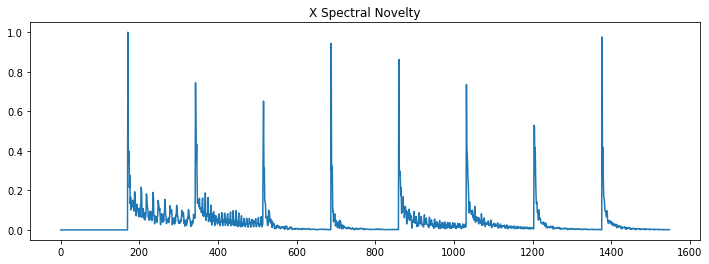

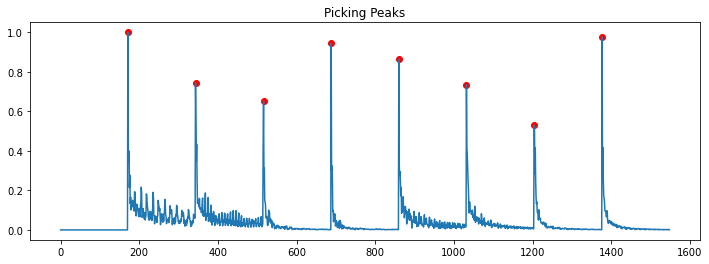

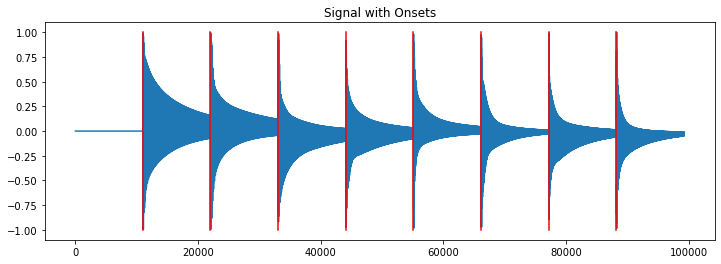

[11008 22016 33088 44096 55104 66112 77120 88192]
[0.49922902 0.99845805 1.50058957 1.99981859 2.49904762 2.99827664
 3.49750567 3.99963719]
mean error: -0.0009 seconds


In [78]:
(On,clicks) = SpectralBasedOnsets(X_KS,window_size=128,overlap=0.5,
                                    kind = 'L1',     # distance function used, L1, L2, CD, SF1, SF2
                                    #filtr = None,    # filter applied before peak picking, if any
                                    #size = 3,        # size of kernel used in filter
                                    #win = None,      # apply windowing function to window
                                    scale=20,      # scale factor for log, None = no log
                                    #height=None,     # these 3 parameters are for pick_peak,
                                    prominence=0.4, #    any not equal to None will be applied
                                    #distance=None,
                                    displayAll=True)



#. just for the KS guitar signal
print((On))
print((On/SR))
e = np.mean((On/SR)-np.array([0.5,1.0,1.5, 2.0, 2.5, 3.0,3.5, 4.0]))
print("mean error:", round4(e), "seconds")

Compare: mean error for amplitude method was -0.0006.

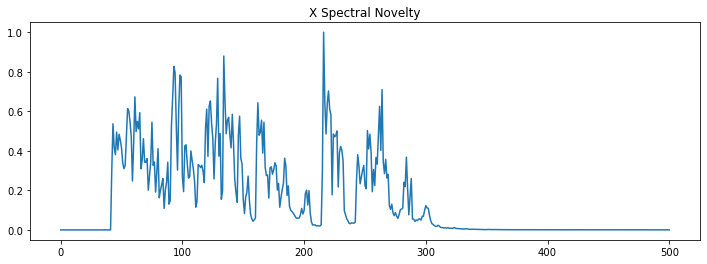

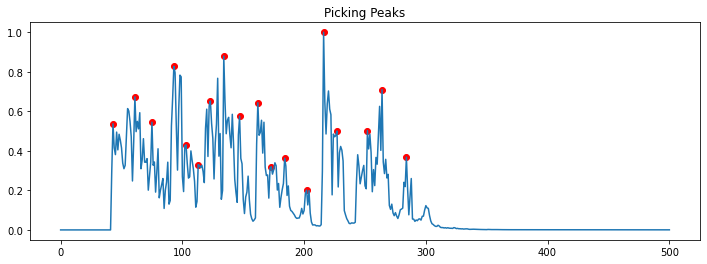

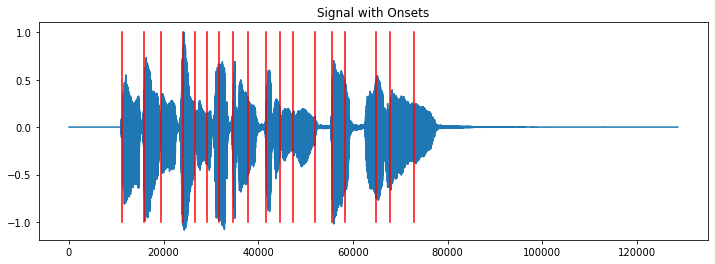

In [80]:
(P3,clicks3) = SpectralBasedOnsets(X3,window_size=512,overlap=0.5,
                                    kind = 'L1',     # distance function used, L1, L2, CD, SF1, SF2
                                    #filtr = None,    # filter applied before peak picking, if any
                                    #size = 3,        # size of kernel used in filter
                                    #win = None,      # apply windowing function to window
                                    scale=50,      # scale factor for log, None = no log
                                    height=0.2,     # these 3 parameters are for pick_peak,
                                    prominence=0.01, #    any not equal to None will be applied
                                    distance=10,
                                    displayAll=True)

Audio([X3,clicks3],rate=SR)

### Rhythm Detection

The first idea in finding periods in higher-level units of rhythm is to apply
the same techniques to the novelty function, namely spectrograms and the FFT!

We will use the rectified version of the novelty function. 

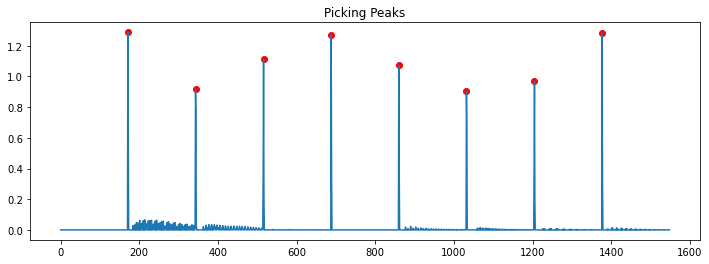

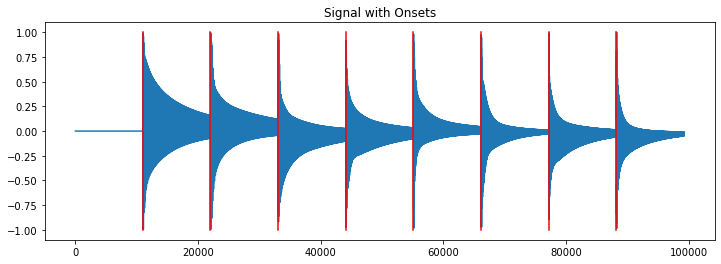

In [196]:
# Amplitude-based rhythm detection





def AmplitudeBasedRhythmDetection(X,window_size=512,overlap=0.5,scale=10,
                         height=None,
                         prominence=None,
                         distance=None,
                         displayAll=False):
    
    N = len(X)
    
    X = X / max(X)       # normalize amplitude

    skip = int((1-overlap)*window_size)

    num_windows = (N // skip) - 1

    window_locations = skip * np.arange(num_windows)

    X_energy = np.array( [ energy( X[ w : (w+window_size)] ) for w in window_locations ])

#     X_energy = []
#     for w in window_locations:
#         e = energy( X[ w : (w+window_size)] )
#         #print(w,(w+window_size),e)
#         X_energy.append(e)
    
    X_energy = np.array(X_energy)
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("X Energy Signal")
        plt.plot(X_energy)
        plt.show()

    # take the log with scaling factor
    # if scale = None, don't do the log

    if(scale == None):
        X_energy_log = X_energy
    else:
        X_energy_log = np.log(1 + scale*X_energy)

        if(displayAll):
            plt.figure(figsize=(12,4))
            plt.title("Log X Energy Signal with scale factor "+str(scale))
            plt.plot(X_energy_log)
            plt.show()

    # Difference = Novelty Function
    
    # add 0 at beginning so diff alines with change in new window
    
    X_energy_log = np.concatenate([[0],X_energy_log])    

    # Take the discrete differential; watch out, diff transforms array in place

    X_energy_novelty = np.diff(list(X_energy_log)) 
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("X Energy Novelty")
        plt.plot(X_energy_novelty)
        plt.show()

    X_energy_novelty_rectified = rectify(X_energy_novelty)      
    
    if(displayAll):
        plt.figure(figsize=(12,4))
        plt.title("Rectified X Energy Novelty")
        plt.plot(X_energy_novelty_rectified)
        plt.show()

    # peak picking

    peaks,_ = find_peaks(X_energy_novelty_rectified,
                         height=height,prominence=prominence,distance=distance)   
    
    plt.figure(figsize=(12,4))
    plt.title("Picking Peaks")
    plt.plot(peaks, X_energy_novelty_rectified[peaks], "or")
    plt.plot(X_energy_novelty_rectified)
    plt.show()
    
    # peaks are beginning of window, more accurate to make the onsets in the middle
    # of the window, reduces potential error by 1/2
    
    onsets = peaks*skip + window_size//2

    plt.figure(figsize=(12,4))
    plt.title("Signal with Onsets")
    plt.plot(X)
    for k in range(len(onsets)):
        plt.plot([onsets[k],onsets[k]],[-1,1],color='r')    
    plt.show()
    
    clicks = librosa.clicks(times=onsets/SR, sr=SR, 
                        hop_length=skip, length=len(X))
    
    
    
    return (onsets,clicks,X_energy_novelty_rectified)

    
(On,clicks,novelty) = AmplitudeBasedRhythmDetection(X_KS,window_size=128,overlap=0.5,
                                   scale=20,prominence=0.2)

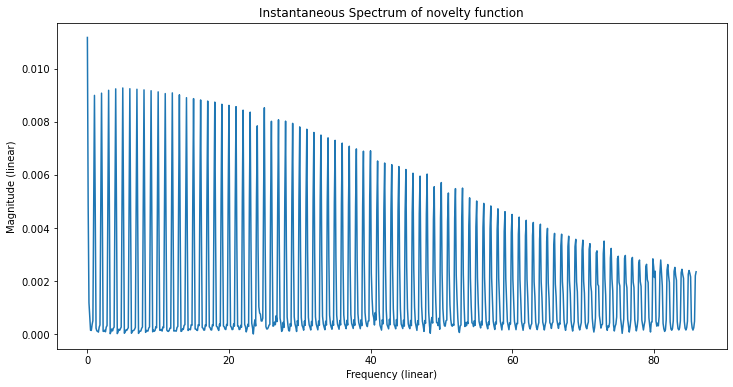

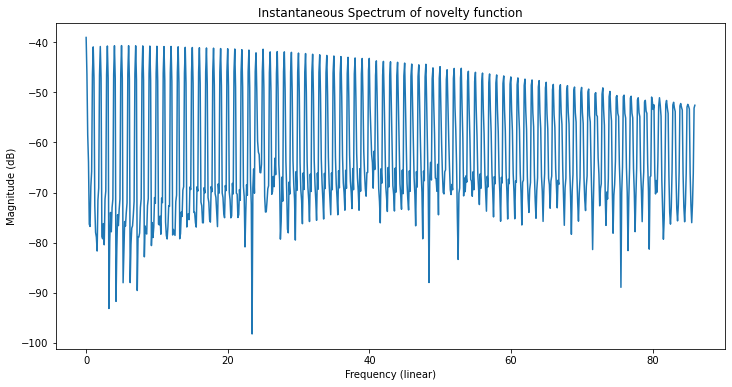

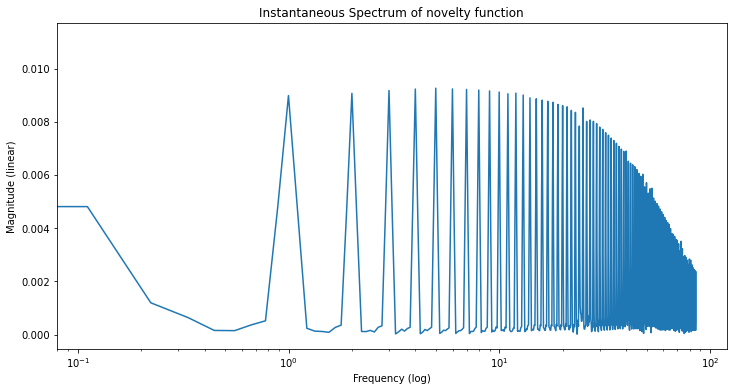

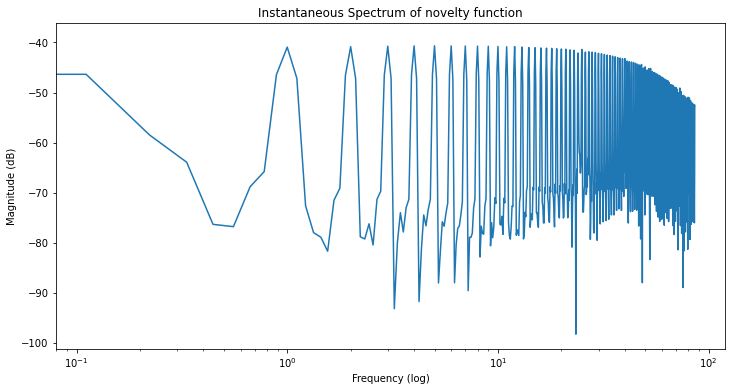

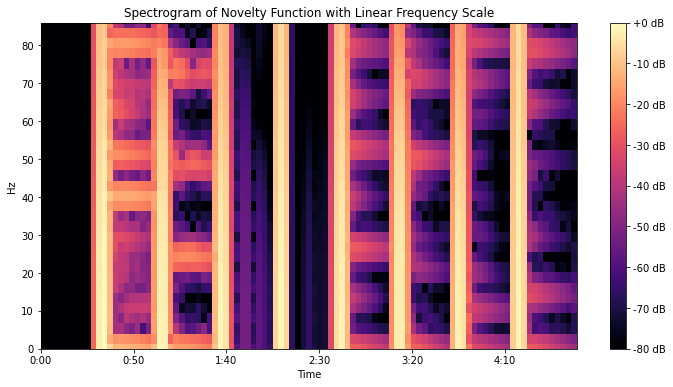

In [199]:
displaySpectrum(novelty,title="Instantaneous Spectrum of novelty function", sr=SR//128,xscale='linear', yscale='linear')

displaySpectrum(novelty,title="Instantaneous Spectrum of novelty function", sr=SR//128,xscale='linear', yscale='dB')

displaySpectrum(novelty,title="Instantaneous Spectrum of novelty function", sr=SR//128,xscale='log', yscale='linear')

displaySpectrum(novelty,title="Instantaneous Spectrum of novelty function", sr=SR//128,xscale='log', yscale='dB')

# display the spectrogram

S = np.abs(librosa.stft(novelty,n_fft=64))      # calculate the 2D spectrogram
Sdb = librosa.amplitude_to_db(S, ref=np.max)    # will show power spectrum in heatmap

plt.figure(figsize=(12,6))
plt.title("Spectrogram of Novelty Function with Linear Frequency Scale")
librosa.display.specshow(Sdb, sr=SR//128, x_axis='time', y_axis='linear',fmax=300)
plt.colorbar(format='%+2.0f dB')
plt.show()

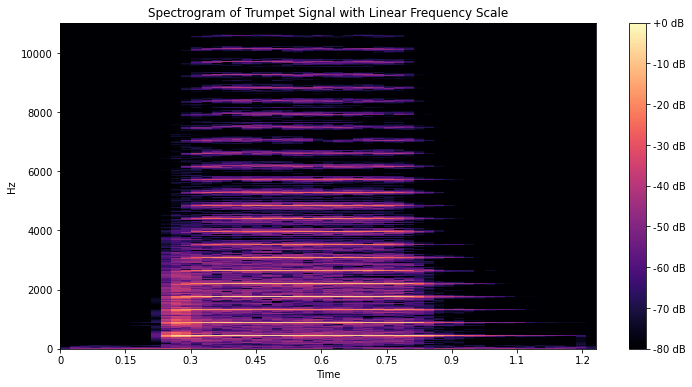

In [200]:
# display the spectrogram

S = np.abs(librosa.stft(X_trumpet))                    # calculate the 2D spectrogram
Sdb = librosa.amplitude_to_db(S, ref=np.max)   # will show power spectrum in heatmap

plt.figure(figsize=(12,6))
plt.title("Spectrogram of Trumpet Signal with Linear Frequency Scale")
librosa.display.specshow(Sdb, sr=SR, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.show()

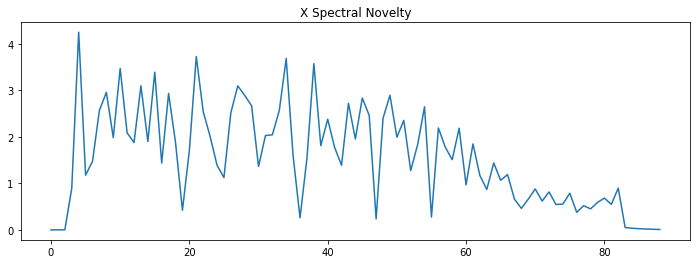

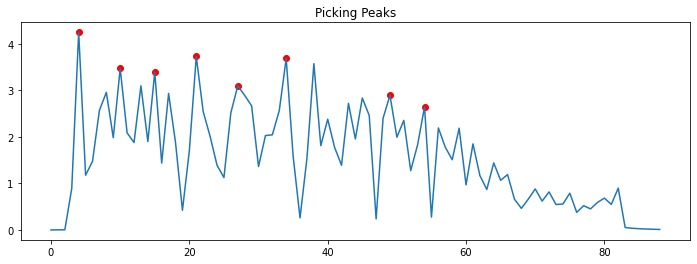

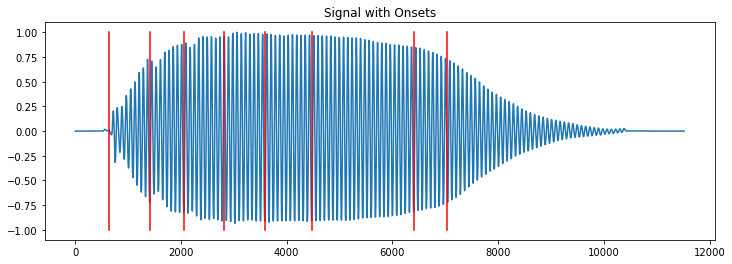

In [51]:


source_folder = '/Users/waynesnyder/Documents/Research/Audio Research/Instrument Samples.forUpload/'

file1 = '016.violin_Fs7_05_fortissimo_arco-normal.mp3'

file2 = '014.tuba_C4_05_piano_normal.mp3'

file3 = '012.trombone_Gs3_05_forte_normal.mp3'

# lengths = []
# for filename in os.listdir(source_folder):
#     if((filename[0] == '.') or (not ('_' in filename))):      # to avoid hidden files such as .DS_Store
#         continue

    
X = readSignal(source_folder + file2)

(P,clicks) = SpectralBasedOnsets(X,window_size=256, overlap=0.5,
#                                      kind = 'L1',
                                     kind = 'L2',
#                                      kind = 'CD',
#                                      kind = 'SF1',
#                                      kind = 'SF2',
#                                      filtr=movingAverageFilter,
#                                      size=5,
#                                      win = None, 
#                                      win = 'hann', 
#                                      win = 'tri', 
                                     scale=100,
                                     height=0.05,
                                     prominence=1,
                                     distance=5,
                                     displayAll=True
                                     )


    
Audio([X,clicks],rate=SR)    

In [ ]:
X2 = readSignal(path+"AnotherOneBitesTheDust.mp3")[:int(SR*10)]

(P2s,clicks2s) = SpectralBasedOnsets(X2,window_size=512, overlap=0.5,
                                     kind = 'L1',
                                     #filtr=movingAverageFilter,
                                     #size=5,
                                     scale=100,
                                     height=0,
                                     prominence=3,
                                     distance=5,
                                     displayAll=True)



Audio([X2,clicks2s],rate=SR)

In [ ]:
X3,_ = librosa.load(librosa.ex('trumpet'))

X3 = np.concatenate([np.zeros(11025),X3])
(P3s,clicks3s) = SpectralBasedOnsets(X3,window_size=512, overlap=0.5,
                                     kind = 'SF2',
                                     #filtr=medianFilter,
                                     #size=3,
                                     scale=100,
                                     height=None,
                                     prominence=0.005,
                                     distance=5,
                                     displayAll=True)

Audio([X3,clicks3s],rate=SR//2)

In [ ]:
X4 = readSignal(path+"invention.C4.wav")[:SR*5]
(P4s,clicks4s) = SpectralBasedOnsets(X4,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X4,clicks4s],rate=SR)

In [ ]:
X6,_ = librosa.load(librosa.ex('choice'))

X6 = X6[:SR*10]
(P6s,clicks6s) = SpectralBasedOnsets(X6,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X6,clicks6s],rate=SR)

In [ ]:
X7,_ = librosa.load(librosa.ex('nutcracker'))

X7 = X7[:SR*10]
(P7s,clicks7s) = SpectralBasedOnsets(X7,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X7,clicks7s],rate=SR)

In [ ]:
X8,_ = librosa.load(librosa.ex('brahms'))

X8 = X8[:SR*7]
(P8s,clicks8s) = SpectralBasedOnsets(X8,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X8,clicks8s],rate=SR)

In [ ]:
X9 = readSignal(path+"MyOldKentuckyHome.wav")

X9 = X9[:SR*8]
(P9s,clicks9s) = SpectralBasedOnsets(X9,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X9,clicks9s],rate=SR)

In [72]:
X10 = readSignal(path+"Shakuhachi_Flute.mp3")

X10 = X10[SR:SR*10]
(P10s,clicks10s) = SpectralBasedOnsets(X10,window_size=512, overlap=0.5,
                                      scale=100,
                                      height=2,
                                      prominence=10,
                                      distance=5)

Audio([X10,clicks10s],rate=SR)

No peaks found!


In [ ]:
X11 = readSignal(path+"Bach.WTC.1.1.mp3")

X11 = X11[:int(SR*10)]
(P11s,clicks11s) = SpectralBasedOnsets(X11,window_size=512, overlap=0.5,
                                     kind = 'e',
                                     #fil=localDiffFilter,
                                     #size=5,
                                     scale=100,
                                     height=1,
                                     prominence=2,
                                     distance=5,
                                     displayAll=True)

Audio([X11,clicks11s],rate=SR)

In [ ]:
x = readSignal(path+"drum.58bpm.wav")

plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=SR)

Audio(x, rate=SR)

In [ ]:
#Compute an onset envelope:

hop_length = 256
onset_envelope = librosa.onset.onset_strength(x, sr=SR, hop_length=hop_length)
#onset_envelope.shape

#Generate a time variable:

N = len(x)
T = N/float(SR)
t = np.linspace(0, T, len(onset_envelope))

#Plot the onset envelope:

plt.figure(figsize=(14, 5))
plt.plot(t, onset_envelope)
plt.xlabel('Time (sec)')
plt.xlim(xmin=0)
plt.ylim(0)
plt.show()

In [ ]:
onset_frames = librosa.util.peak_pick(onset_envelope, 7, 7, 7, 7, 0.5, 5)
onset_frames

In [ ]:
N

In [ ]:


clicks = librosa.clicks(frames=onset_frames, sr=22050, hop_length=hop_length, length=N)

plt.figure(figsize=(14, 5))
plt.plot(clicks)
plt.show()

In [ ]:
#Plot the onset envelope along with the detected peaks:

plt.figure(figsize=(14, 5))
plt.plot(t, onset_envelope)
plt.grid(False)
plt.vlines(t[onset_frames], 0, onset_envelope.max(), color='r', alpha=0.7)
plt.xlabel('Time (sec)')
plt.xlim(0, T)
plt.ylim(0)
plt.show()

#Superimpose a click track upon the original:

clicks = librosa.clicks(frames=onset_frames, sr=22050, hop_length=hop_length, length=N)
Audio(x+clicks, rate=SR)